# Part 0: napari

This part of the course is given interactively. This notebooks serves only as a reference to re-create the steps shown live. The goal is to introduce interactively some of the concepts treated in the following notebooks via code.

In [1]:
import napari
import imageio.v2 as imageio 
from napari.utils import nbscreenshot

## 1. Loading and visualization

### 1.1 Load

In napari we can either first import the images and then add them to the viewer, or directly open them via the viewer. Here we load the image as a numpy array:

In [2]:
bbbc010_live = imageio.imread('data/Part_1/BBBC010/live.tif')

### 1.2 Visualize

Then we can add the image to the viewer:

In [3]:
viewer = napari.Viewer()
viewer.add_image(bbbc010_live);

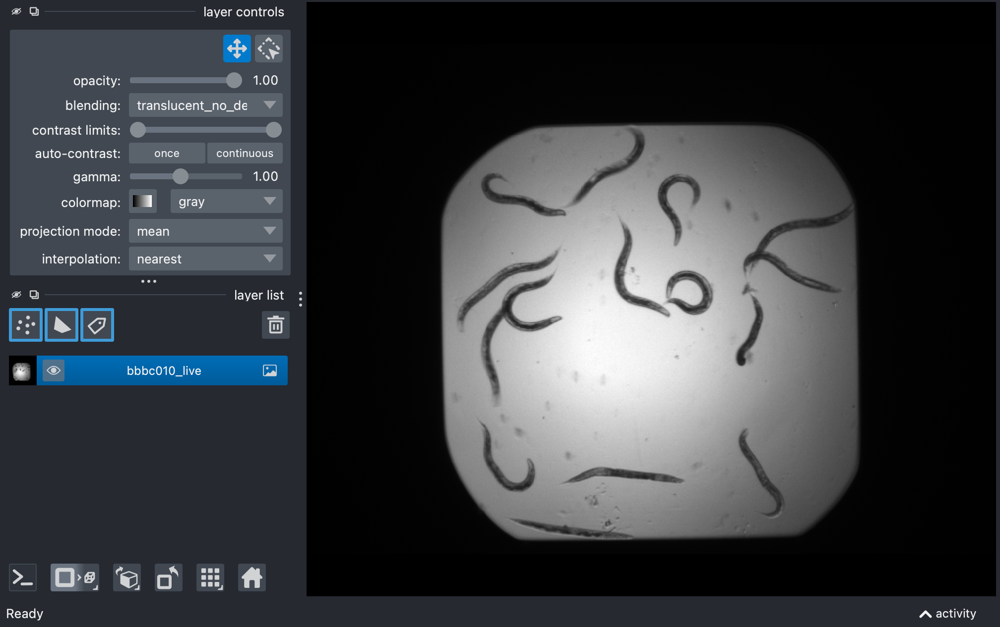

In [4]:
nbscreenshot(viewer)

Alternatively we can simply open images via ```File -> Open File(s)``` or use the ```open``` method of the viewer:

In [5]:
viewer = napari.Viewer()

In [6]:
viewer.open('data/Part_1/BBBC010/live.tif', name='bbbc020_cell_live')
viewer.open('data/Part_1/BBBC010/dead.tif', name='bbbc020_cell_dead');

In [7]:
viewer.open('data/Part_1/BBBC020/membranes.tif', name='membranes')
viewer.open('data/Part_1/BBBC020/nuclei.tif', name='nuclei');

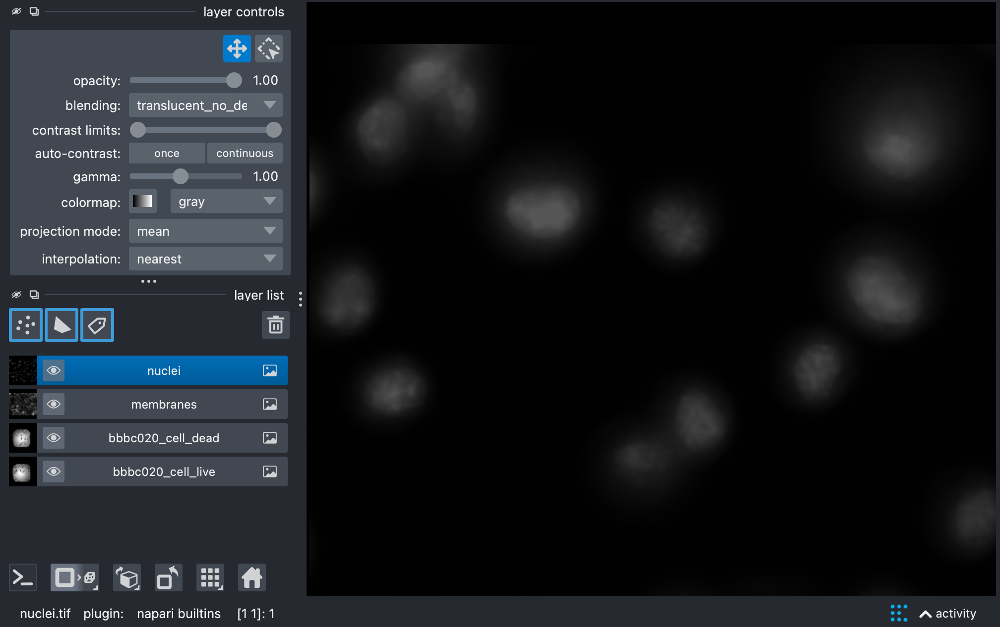

In [8]:
nbscreenshot(viewer)

We can also look at all pictures at once using the grid mode:

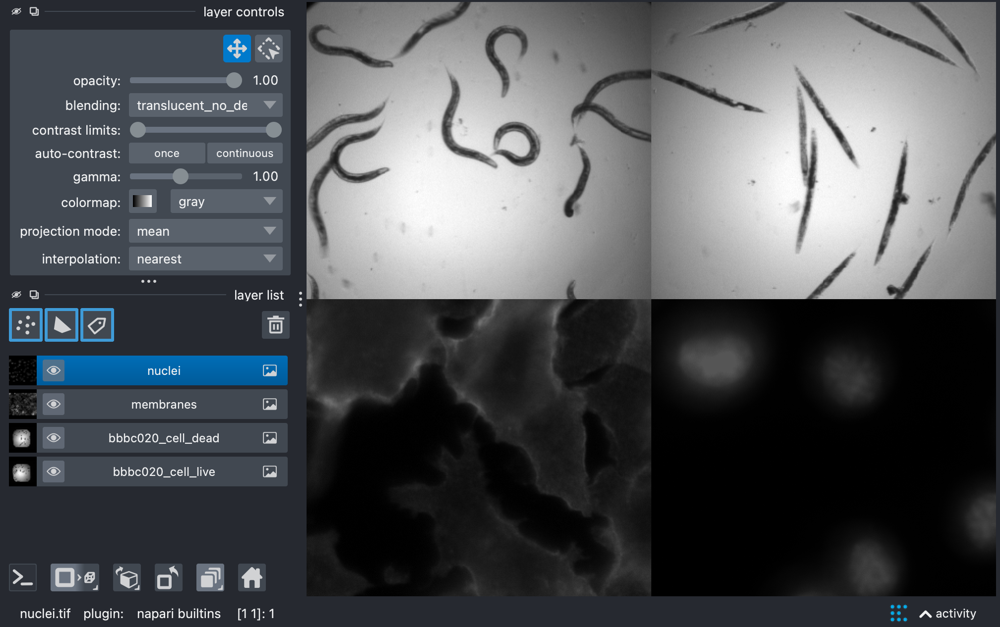

In [9]:
viewer.grid.enabled = True
nbscreenshot(viewer)

### 1.3 Colormaps

In [10]:
viewer.layers['nuclei'].colormap = 'magenta'
viewer.layers['membranes'].colormap = 'yellow'

### 1.4 Cropping

For cropping we can use the ```napari-skimage``` plugin:

In [11]:
viewer = napari.Viewer()
viewer.open('data/Part_1/BBBC010/live.tif', name='bbbc020_cell_live');
_, crop_widget = viewer.window.add_plugin_dock_widget(plugin_name='napari-skimage', widget_name='Crop rectangle');

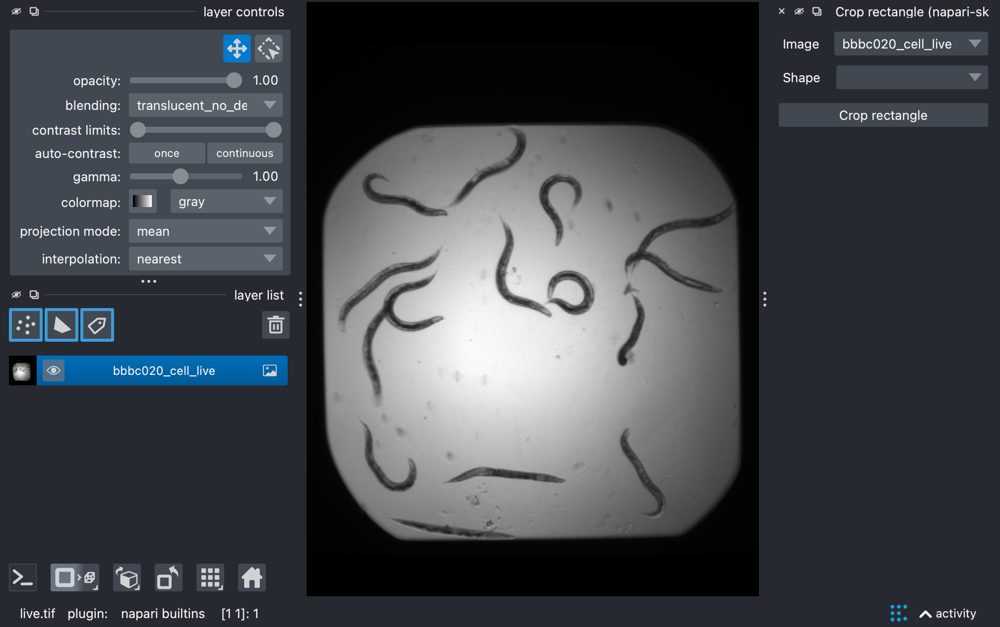

In [12]:
nbscreenshot(viewer)

We see on the right that the plugin will use a shape layer for cropping. So let's add one and a shape:

In [13]:
viewer.add_shapes(data=[[100,250],[300,250],[300,450],[100,450]]);

In [14]:
crop_widget()
viewer.layers[0].visible = False
viewer.layers[1].visible = False

Now we can use that layer for cropping. We obtain a new image layer with the cropped image:

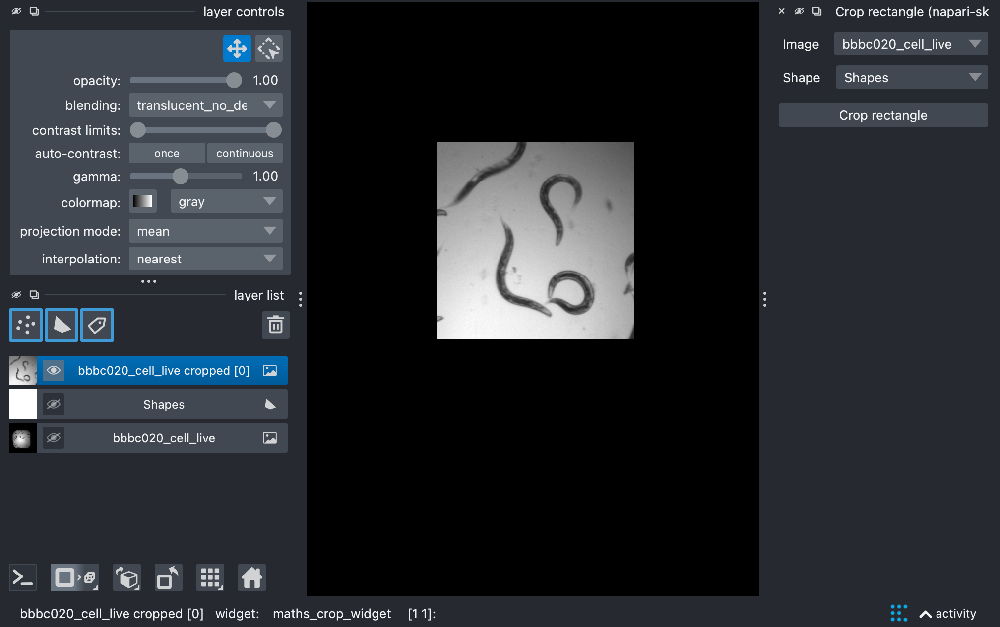

In [15]:
nbscreenshot(viewer)

### 1.5 Roi editing

All components in napari can be edited. For example we can turn the roi into a red square:

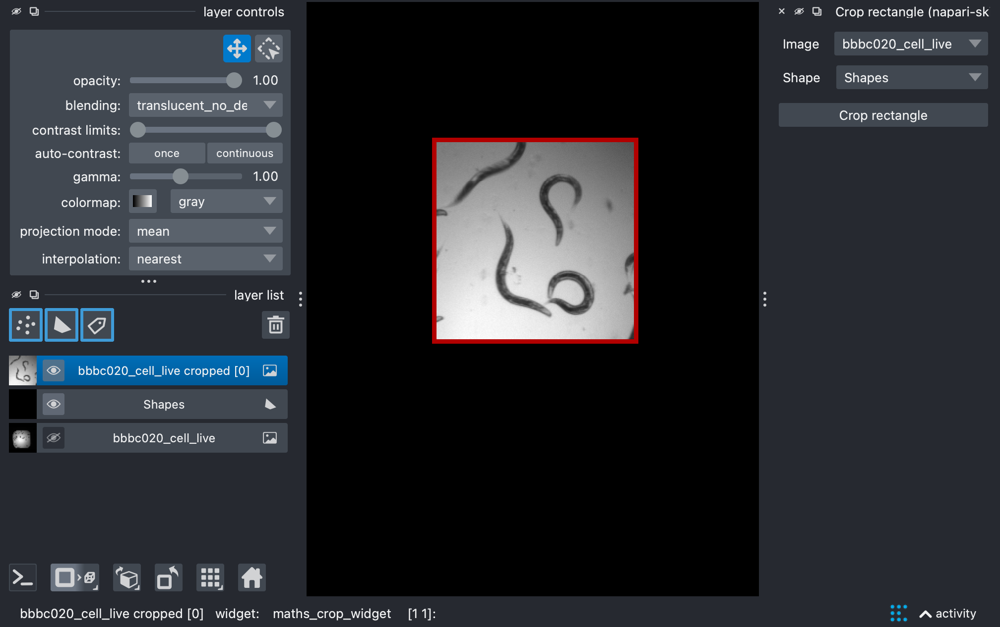

In [16]:
viewer.layers['Shapes'].face_color = [0,0,0,0]
viewer.layers['Shapes'].edge_color = [1,0,0,1]
viewer.layers['Shapes'].edge_width = 10
viewer.layers[1].visible = True

nbscreenshot(viewer)

## 2. Image modifications

Some image modifications can be executed from plugins similar to ```napari-skimage```. Some other more custom modifications need to be done at the array level and are reflected in the viewer.

### 2.1 Masking

Masking, where we change the pixel values in a certain region, needs to be done at the array level. We can recover the data from a layer:

In [17]:
masked_img = viewer.layers['bbbc020_cell_live'].data.copy()

And then mask it:

In [18]:
# Region to be masked
(width, height) = masked_img.shape
origin = (int(0.5*width),int(0.5*height))
size = (int(0.2*width),int(0.2*height))

# Masking
masked_img[origin[0]:origin[0]+size[0],origin[1]:origin[1]+size[1]] = 0

In [19]:
viewer.add_image(masked_img, name='masked image');

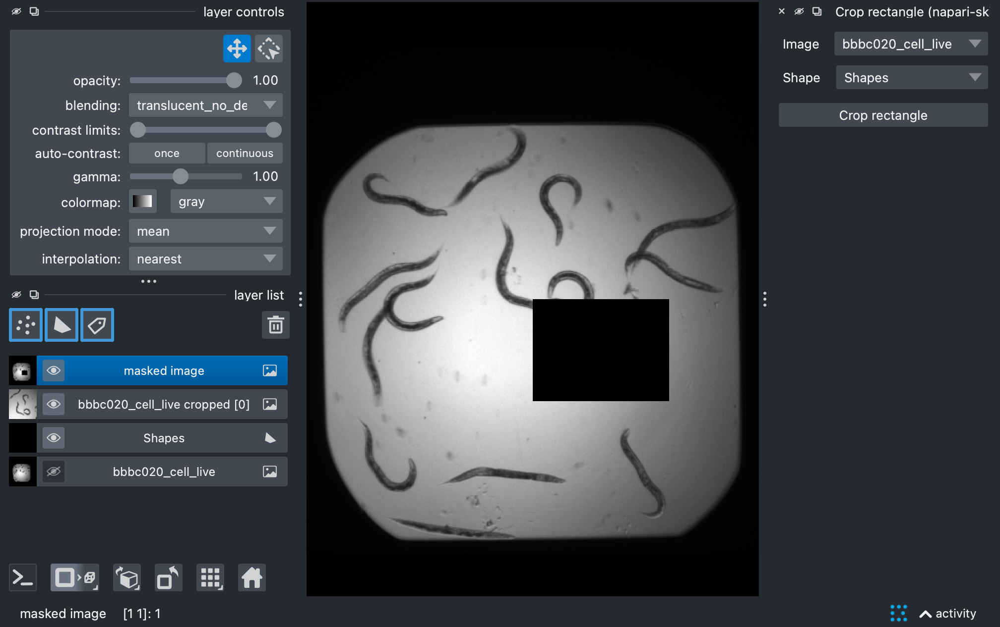

In [20]:
nbscreenshot(viewer)

### 2.2 Inverting

(see later in the session and try to visualize with napari as well!)

### 2.3 Filtering

Filtering and many other functionalities are provided by the ```napari-skimage``` plugin. For example the interface for Gaussian filtering can be opened via ```Plugins -> napari skimage -> Gaussian filter``` and looks as visible below (note that the code below reproduces what can be done manually in the plugin and is not how plugins are usually used!).

In [21]:
viewer = napari.Viewer()
viewer.open('data/Part_1/BBBC010/live.tif', name='bbbc020_cell_live');

In [22]:
from napari_skimage.skimage_filter_widget import gaussian_filter_widget
gaussian_widget = gaussian_filter_widget()
_, gaussian_widget = viewer.window.add_plugin_dock_widget('napari-skimage', 'Gaussian filter');
gaussian_widget.sigma.value = 10
gaussian_widget()
viewer.grid.enabled = True

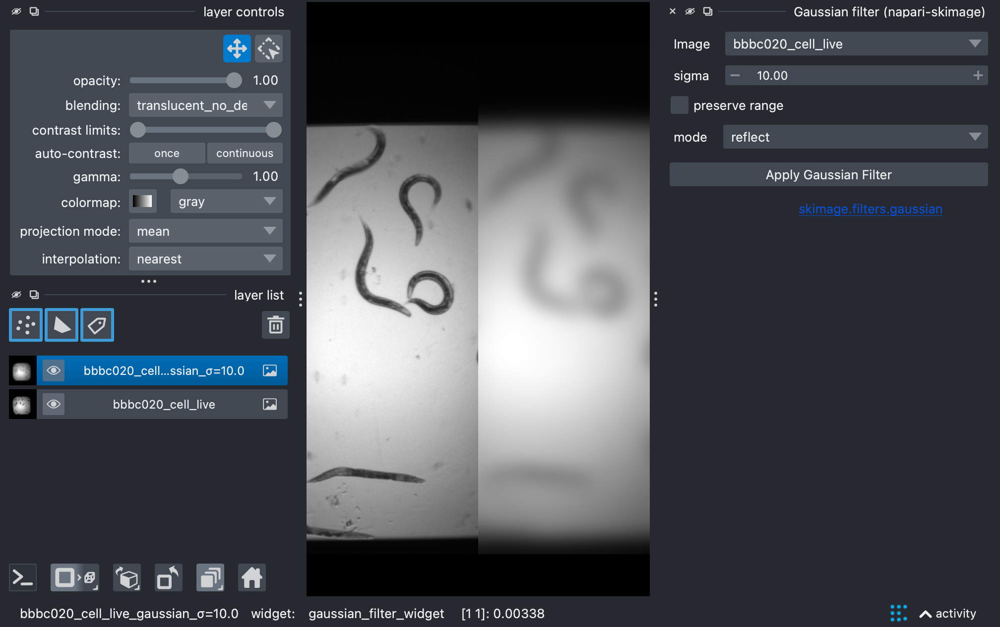

In [23]:
nbscreenshot(viewer)

### 2.4 Image processing

Multiple operations can be combined to perform image processing. For example we can first filter an image with a Gaussian filter and then subtract it from the original image. Operations between images are available under ```Plugins -> napari skimage -> Image pairs maths```. Try to find out how to do that via the plugin. Does it work as expected? How can you fix it.

## 3. Segmentation

In this section we are seeing how to detect objects in an image using classical methods such as thresholding and watershed. The same approach is used via code in the notebooks [2 - Segmentation.ipynb](2 - Segmentation.ipynb).

First we load the image `data/Part_2/BBBC020/easier.tif` in napari:

In [24]:
viewer = napari.Viewer()
viewer.open('data/Part_2/BBBC020/easier.tif');

In [25]:
viewer.window.set_geometry(0, 0, 1200, 800)

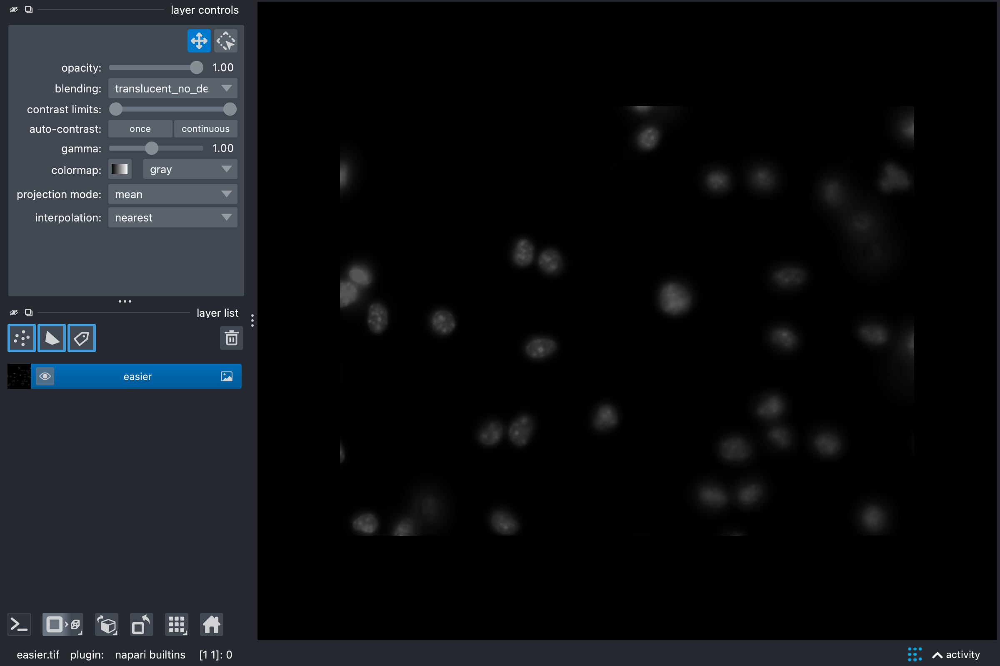

In [26]:
nbscreenshot(viewer)

In this image the nuclei are bright on a dark background and so we can set a threshold to assign pixels to objects or background. We can do that using an automated like Otsu in the `napari-skimage` plugin (plugins -> napari-skimage -> Automated Threshold):

In [27]:
threshold_q, threshold_widget = viewer.window.add_plugin_dock_widget('napari-skimage', 'Automated Threshold')
threshold_widget();

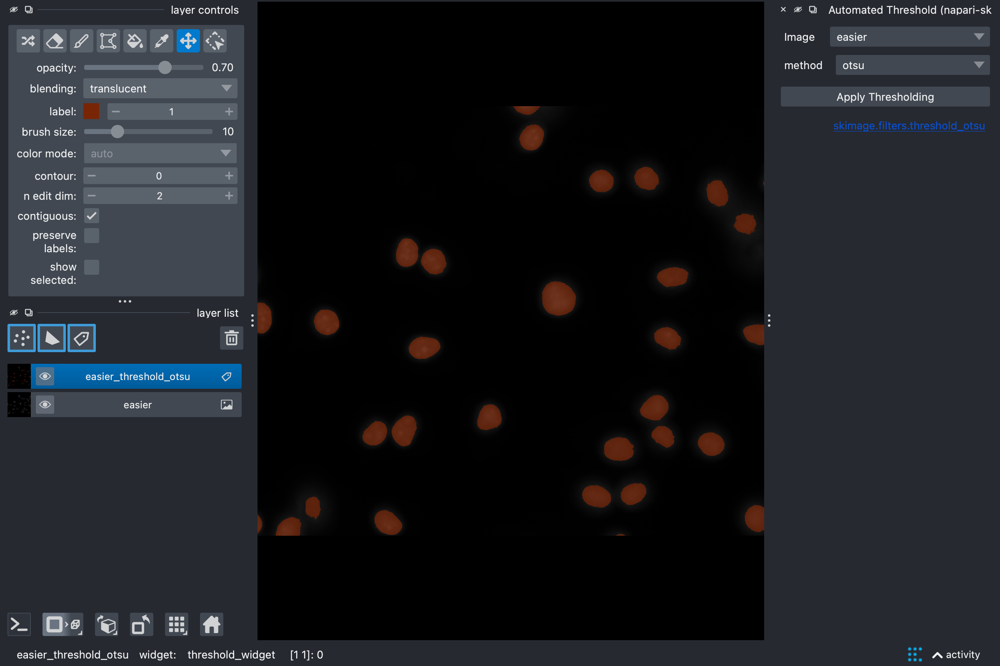

In [28]:
nbscreenshot(viewer)

We can now label the nuclei by detecting which pixels are connected together. This can be done using Plugins -> napari-skimage -> Connected components:

In [29]:
viewer.window.remove_dock_widget(threshold_q)
label_q, label_widget = viewer.window.add_plugin_dock_widget('napari-skimage', 'Label connected components');
label_widget();

INFO: Labeled 49 regions


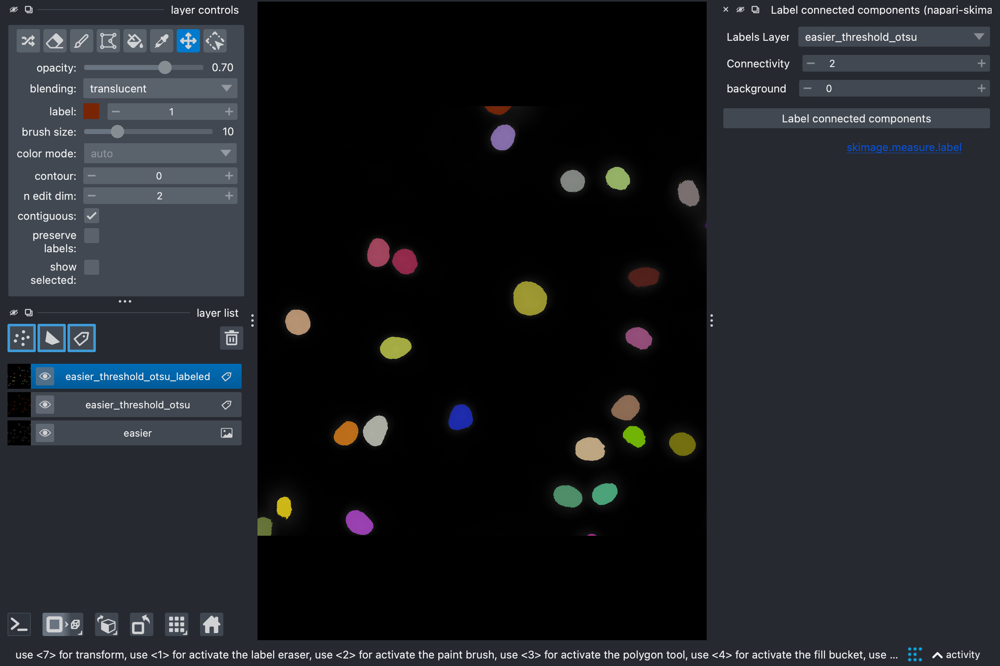

In [30]:
nbscreenshot(viewer)

In some cases thresholding leaves some objects connected in such a way that labelling via connected component analysis just generates bigger blobs. This is visible on the left of the image:

In [31]:
viewer.camera.center = (0.0, 427.8397944072284, 91.77178371754474)
viewer.camera.zoom = 1.1863

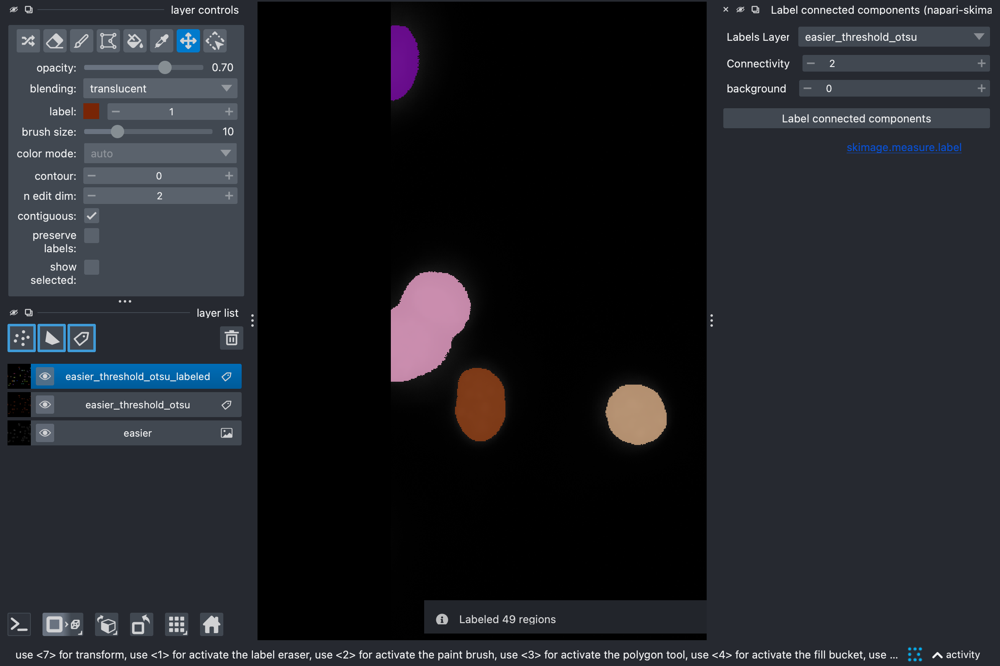

In [32]:
nbscreenshot(viewer)

To fix this we can exploit the fact the blob is made of two blobs, creating a convave regions between them. If we compute the distance of each pixel of the blob to its border, the centers of each blob will be the points with the largest distance. With this approach, locating local maxima in distance, we can deduce the number of blobs forming a blob and use that information to split it.

Let's do that using some functions from the napari-skimage plugin:
1. Measure the distance of each pixel to the border using the Distance Transform:

In [33]:
viewer.window.remove_dock_widget(label_q)
distance_q, distance_transform_widget = viewer.window.add_plugin_dock_widget('napari-skimage', 'Distance Transform')
distance_transform_widget.labels
distance_transform_widget.layer.value = viewer.layers['easier_threshold_otsu']
distance_transform_widget();

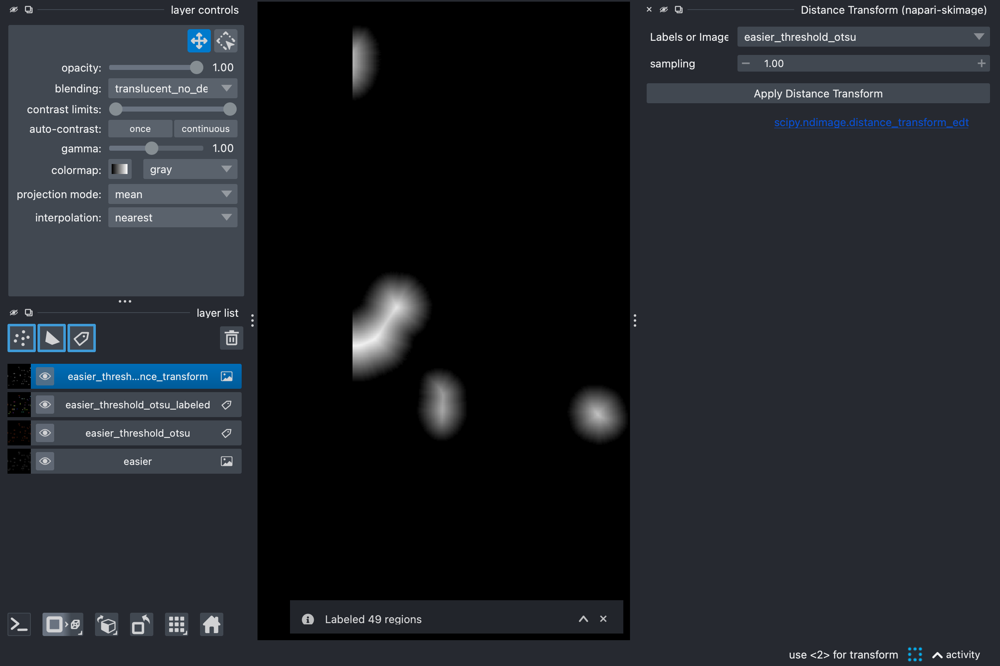

In [34]:
nbscreenshot(viewer)

2. Now we can detect the center of the objects using a local maxima detection. The result is a points layer with the maxima annotated. To seed the watershed function we however need an image with seeds. So in a second step, we transform the points layer into a labels image:

In [35]:
viewer.window.remove_dock_widget(distance_q)
peak_q, peak_local_max_widget = viewer.window.add_plugin_dock_widget('napari-skimage', 'Peak Local Max')
peak_local_max_widget.threshold_absolute.value = 10
peak_local_max_widget.min_distance.value = 20
peak_local_max_widget.image_layer.value = viewer.layers['easier_threshold_otsu_distance_transform']
peak_local_max_widget();

points_to_lables_q, points_to_labels_widget = viewer.window.add_plugin_dock_widget('napari-skimage', 'Convert Points to Labels')
points_to_labels_widget();

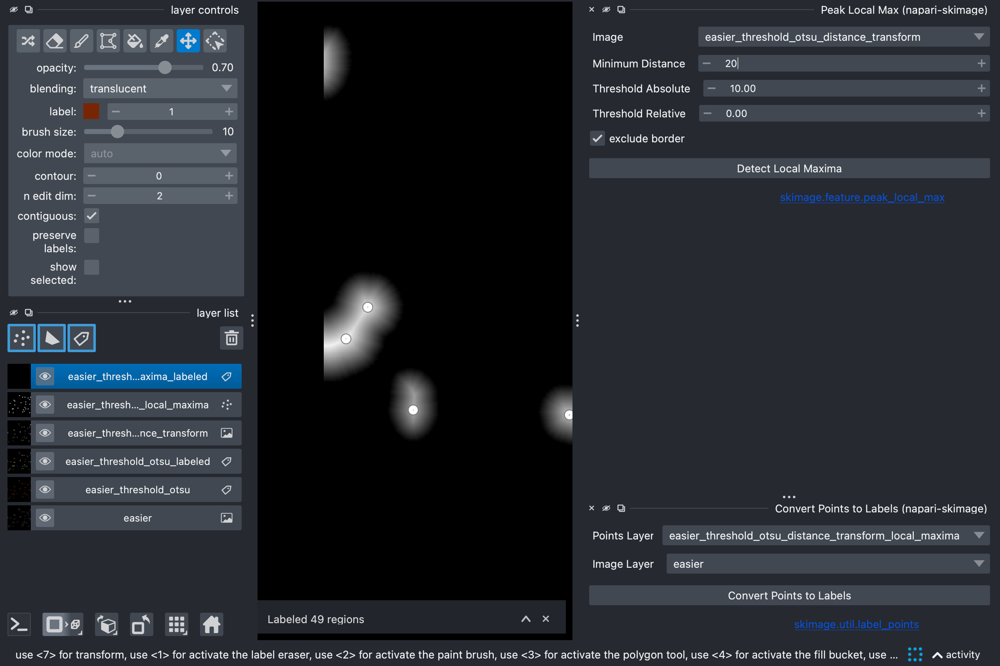

In [36]:
nbscreenshot(viewer)

With this operation, we see that we get one local peak per single blob as well as two peaks in the larger merged blob. 

5. In a final step we can now use the mask, the seeds and the watershed transform to create a better segmentation:

In [37]:
viewer.window.remove_dock_widget(peak_q)
viewer.window.remove_dock_widget(points_to_lables_q)
watershed_q, watershed_widget = viewer.window.add_plugin_dock_widget('napari-skimage', 'Watershed')
watershed_widget.image_layer.value = viewer.layers['easier_threshold_otsu_distance_transform']
watershed_widget.label_layer.value = viewer.layers['easier_threshold_otsu_distance_transform_local_maxima_labeled']
watershed_widget.mask_layer.value = viewer.layers['easier_threshold_otsu']
watershed_widget.invert_image.value = True
watershed_widget.watershed_lines.value = True
watershed_widget();

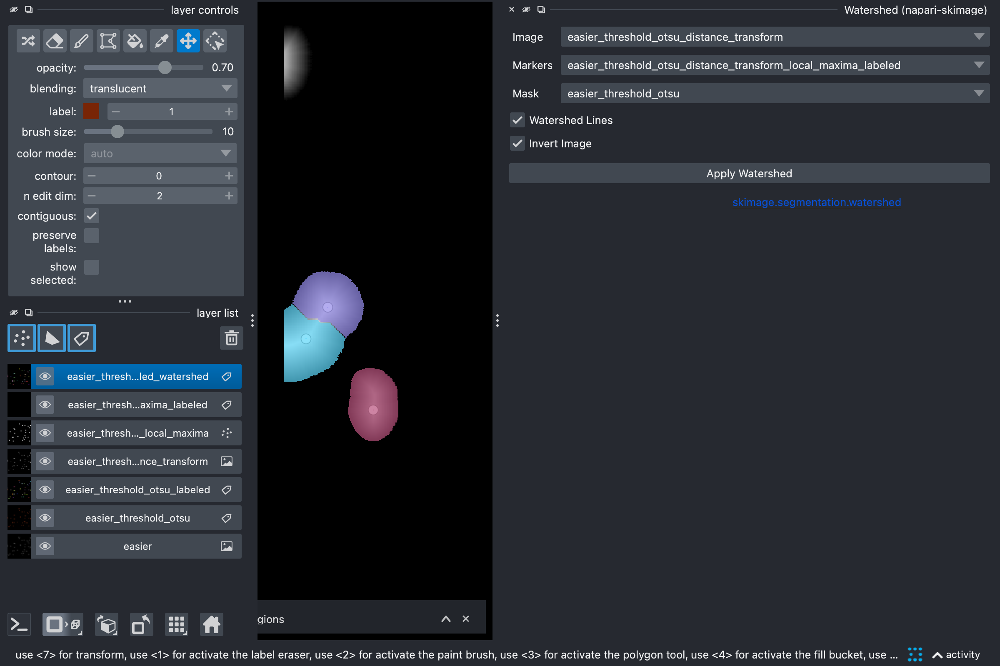

In [38]:
nbscreenshot(viewer)

## 4. Export

The images in the napari viewer can be exported in various ways. First we can take a screenshot of the viewer from ```File -> Save screenshot```. **This is not meant to save scientific data** but more to generate documentation or visualizations for presentations. The data present in layers can be saved via ```File -> Save Selected Layers```. Note that this feature is not optimized and you should expect trouble from time to time.  

Screenshots are taken at the resolution of the viewer on your machine. If you need that screenshot at higher resolution (e.g. to show it in a presentation), we can control this by using a different screenshot function. If you get errors like `GL_INVALID_VALUE`, decrease the requested size of the screenshot. Correctly zooming & centering these screenshots can be a bit tricky though.

In [39]:
image = viewer.screenshot(
    canvas_only=True,
    flash=False,
    size=(8000, 8000),  # set desired output size (in pixels)
)
imageio.imsave("my_screenshot.png", image)